# Fast Convolution

This code is provided as supplementary material of the lecture "Coding of Audiovisual Signals".

This code illustrates
* Filtering using the overlap-add method

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as signal
from scipy.io import wavfile
import IPython.display as ipd
from pylab import rcParams
rcParams['axes.xmargin'] = 0

Load and display wave file

In [2]:
def audio_load(filename, sr = None):
    old_sampling_rate, x = wavfile.read(filename)
    if len(x.shape) == 2:
        x = np.squeeze(x[:,0])
    x = x/32768
    if sr is not None:
        sampling_rate = sr
        number_of_samples = round(len(x) * sampling_rate / old_sampling_rate) 
        x = sp.resample(x, number_of_samples)
    else:
        sampling_rate = old_sampling_rate
    return x, sampling_rate

In [3]:
def audio_display_waveshow(y, sr, alpha = 0.8, color = 'skyblue', linewidth = 1):
    time = np.linspace(0, len(y) / sr, num=len(y))
    #plt.plot(time, y, color=color, alpha=alpha, linewidth=1)
    #plt.xlim(time[0], time[-1])
    fig, ax = plt.subplots(figsize=(14, 4))
    ax.fill_between(time, -np.abs(y), np.abs(y), color='skyblue')
    plt.xlabel("Time")


In [4]:
#wave_filename = '../audio/33711__acclivity__excessiveexposure.wav'
wave_filename = '../audio/E-Core - Pingouin-Banquise_45s.wav'
#wave_filename = '../audio/KIMIKO ISHIZAKA - Goldberg Variations BWV 988 - 01 - Aria_45s.wav'
x, sampling_rate = audio_load(wave_filename)

<Figure size 1400x500 with 0 Axes>

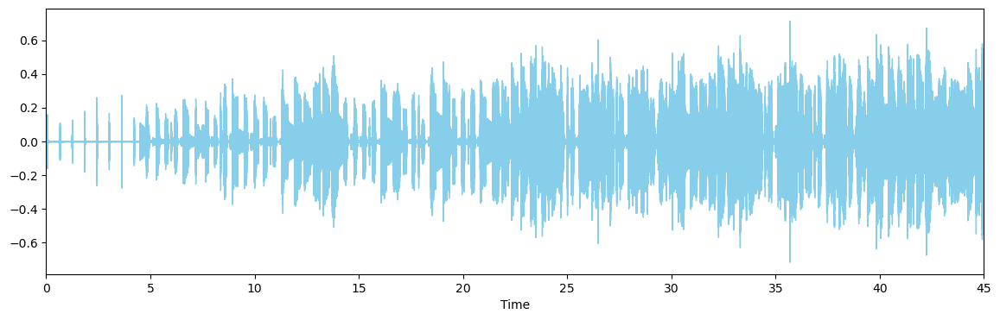

In [5]:
plt.figure(figsize=(14, 5))
audio_display_waveshow(x, sr=sampling_rate)

In [6]:
ipd.Audio(x, rate=sampling_rate)

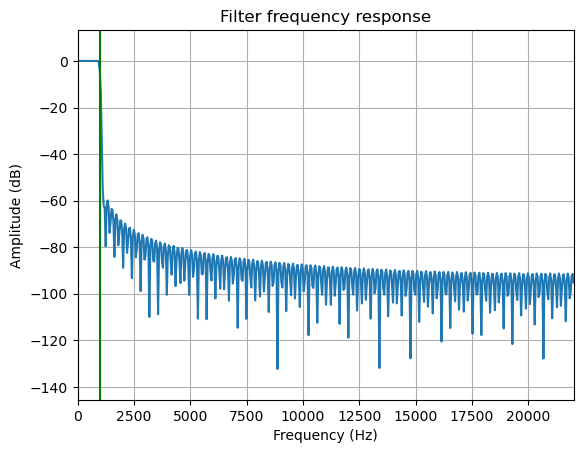

In [7]:
# define low-pass FIR filter 
# number of coefficients
N_taps = 800

# Cutoff frequency, remove everything above 1 KhZ
f_cutoff = 1000

# note that the cutoff frequency is normalized to the Nyquist frequency
taps = signal.firwin(N_taps, f_cutoff/(sampling_rate/2))
w, h = signal.freqz(taps, fs=sampling_rate)
plt.plot(w, 20 * np.log10(abs(h)))
plt.title('Filter frequency response')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude (dB)')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(f_cutoff, color='green') # cutoff frequency
plt.show()

In [8]:
# carry out filter as a reference
y = np.convolve(x, taps)

In [9]:
ipd.Audio(y, rate=sampling_rate)

In [10]:
# Filtering using overlap add
L_h = len(taps)
L = 1000  # length of blocks of signal x
M = int(np.power(2,np.ceil(np.log2(L_h + L - 1))))
print('M = %d ... L_h + L -1  = %d' % (M,L+L_h-1))

frames = int(np.floor(len(x) / L))

x_lpad = np.zeros(M)
h_pad = np.zeros(M)
h_pad[:L_h] = taps
H = np.fft.fft(h_pad)   # compute DFT

y_overlap_add = np.zeros(frames*L+(M-L))

for l in range(frames):   
    x_l = x[np.arange(L)+l*L]
    x_lpad[:L] = x_l
    X_l = np.fft.fft(x_lpad)
    # multiplication in spectrum
    Y_l = np.multiply(X_l, H)
    y_l = np.fft.ifft(Y_l)
    
    # carry out actual overlap-add
    y_overlap_add[np.arange(M) + l*L] += np.real(y_l)

M = 2048 ... L_h + L -1  = 1799


In [11]:
ipd.Audio(y_overlap_add, rate=sampling_rate)

<Figure size 1400x500 with 0 Axes>

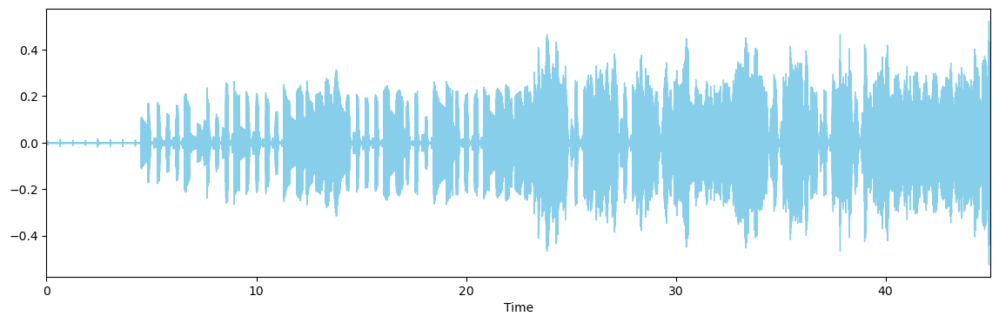

In [12]:
plt.figure(figsize=(14, 5))
audio_display_waveshow(y_overlap_add, sr=sampling_rate)